In [ ]:
import os
import torch
import torchvision
from torch.utils.data import random_split
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from sklearn.metrics.cluster import normalized_mutual_info_score
from torch.utils.data.sampler import Sampler


import time

In [ ]:
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
from PIL import Image

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from collections import defaultdict

# 데이터 불러오기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/MyDrive/고통"

/content/drive/MyDrive/고통


In [ ]:
#!unzip -qq "/content/drive/MyDrive/고통/articles.csv.zip"

In [ ]:
#!unzip -qq "/content/drive/MyDrive/고통/customers.csv.zip"

In [ ]:
#!unzip -qq "/content/drive/MyDrive/고통/transactions_train.csv.zip"

In [ ]:
#!unzip -qq "/content/drive/MyDrive/고통/images.zip"

In [ ]:
trs_data = pd.read_csv('transactions_train.csv')

In [ ]:
article_data = pd.read_csv('articles.csv')

In [ ]:
#train_article = pd.read_csv('train_article2.csv')

In [ ]:
#test_article = pd.read_csv('test_article2.csv')

In [ ]:
customers_data = pd.read_csv('customers.csv')

In [ ]:
#pd.set_option('display.max_columns', 100)

In [ ]:
#article_data

In [ ]:
trs_data

,t_dat,customer_id,article_id,price,sales_channel_id
0,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,663713001,0.050831,2
1,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,541518023,0.030492,2
2,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,505221004,0.015237,2
3,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,685687003,0.016932,2
4,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,685687004,0.016932,2
...,...,...,...,...,...
31788319,2020-09-22,fff2282977442e327b45d8c89afde25617d00124d0f999...,929511001,0.059305,2
31788320,2020-09-22,fff2282977442e327b45d8c89afde25617d00124d0f999...,891322004,0.042356,2
31788321,2020-09-22,fff380805474b287b05cb2a7507b9a013482f7dd0bce0e...,918325001,0.043203,1
31788322,2020-09-22,fff4d3a8b1f3b60af93e78c30a7cb4cf75edaf2590d3e5...,833459002,0.006763,1


In [ ]:
from tqdm import tqdm

In [ ]:
for i in tqdm(range(105542)):
    base_path = '/content/drive/MyDrive/고통/고통/'
    article_id = '0' + str(article_data.loc[i]['article_id']) + '.jpg'
    image_path = os.path.join(base_path, article_id[0:3], article_id)
    if (not os.path.exists(image_path)):
        article_data = article_data.drop(i)
        
len(article_data) 

100%|██████████| 105542/105542 [03:16<00:00, 537.76it/s] 


105100

In [ ]:
article_data = article_data.reset_index()

In [ ]:
article_data = article_data.drop('index',axis=1)

In [ ]:
Ladies = article_data[article_data.index_group_name == 'Ladieswear'].reset_index(drop=True)

In [ ]:
Ladies

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39547,952937003,952937,Jets dress,265,Dress,Garment Full body,1010001,All over pattern,13,Beige,...,Jersey,A,Ladieswear,1,Ladieswear,18,Womens Trend,1005,Jersey Fancy,"Fitted, calf-length dress in viscose jersey wi..."
39548,952938001,952938,Elton top,254,Top,Garment Upper body,1010001,All over pattern,13,Beige,...,Jersey,A,Ladieswear,1,Ladieswear,18,Womens Trend,1005,Jersey Fancy,Fitted top in jersey with a round neckline and...
39549,953763001,953763,SPORT Malaga tank,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Jersey,A,Ladieswear,1,Ladieswear,2,H&M+,1005,Jersey Fancy,Loose-fitting sports vest top in ribbed fast-d...
39550,956217002,956217,Cartwheel dress,265,Dress,Garment Full body,1010016,Solid,9,Black,...,Jersey,A,Ladieswear,1,Ladieswear,18,Womens Trend,1005,Jersey Fancy,"Short, A-line dress in jersey with a round nec..."


In [ ]:
def get_img_path(id):
    article_id = '0' + str(id) + '.jpg'
    base_path = "/content/drive/MyDrive/고통/고통"
    image_path = os.path.join(base_path, article_id[0:3], article_id)
    return image_path

Ladies['path'] = Ladies['article_id'].map(get_img_path)
img_path_list = Ladies['path']
img_path_list[0]

'/content/drive/MyDrive/고통/고통/010/0108775015.jpg'

In [ ]:
class fashion_Datasets(Dataset):
    def __init__(self, img_path_list, transform=None, labels=[]):
        self.img_path_list = img_path_list
        self.transform = transform
        self.labels = labels
        
    def __len__(self):
        return len(self.img_path_list)
    
    def __getitem__(self, i):
        img = Image.open(self.img_path_list[i]).convert('RGB')
        idx = img_path_list[i].split('/')[-1][:-4]
        label = self.labels[i] if self.labels else 0
        
        if self.transform is not None:
            img = self.transform(img)
        
        return img,label

In [ ]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

transform =  transforms.Compose([transforms.Resize((224,224)),transforms.ToTensor()]) # normalize하면 선명해짐 
image_dataset = fashion_Datasets(img_path_list = img_path_list, transform=transform) 

In [ ]:
#img_path_list[img_path_list == '/content/drive/MyDrive/고통/061/0616100001.jpg']

In [ ]:
#del img_path_list[9476]

In [ ]:
#img_path_list = img_path_list.reset_index(drop=True)

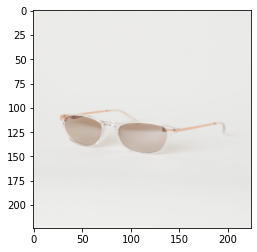

In [ ]:
temp_image = image_dataset[152][0].numpy()
temp_image = np.transpose(temp_image, (1,2,0))
plt.imshow(temp_image)

In [ ]:
image_dataset[0][0].shape

torch.Size([3, 224, 224])

In [ ]:
len(image_dataset)*0.6

23731.2

# Extract Feature Map via Deep Clustering

In [ ]:
from sklearn.decomposition import IncrementalPCA
from sklearn.cluster import MiniBatchKMeans
from torch.optim import Adam

In [ ]:
def extract_features(model, dataset, batch_size=batch_size):

    loader = DataLoader(dataset, batch_size=batch_size)
    features = []
    model.eval()
    for image, _ in tqdm(loader, desc='extracting features'):
        output = model(Variable(image).cuda())
        features.append(output.data.cpu())
    return torch.cat(features).numpy() 

In [ ]:
def cluster(pca, kmeans, model, dataset, batch_size, return_features=False):
    features = extract_features(model, dataset, batch_size)  
    print(features)
    reduced = pca.fit_transform(features)
    pseudo_labels = list(kmeans.fit_predict(reduced))
    if return_features:
        return pseudo_labels, features
    return pseudo_labels

In [ ]:
def train(model, train_dataset, batch_size, sampler):
    train_loader = DataLoader(train_dataset, batch_size=batch_size,sampler=sampler)
    total_loss = 0
    
    #mlp = list(model.classifier.children()) # Classifier 구조 불러오기 
    #mlp.append(nn.ReLU(inplace=True).cuda())
    #mlp.append(nn.Dropout(p=0.5, inplace=False).cuda()) 
    #mlp.append(nn.Linear(4096, num_classes).cuda())

    mlp = nn.Sequential(nn.ReLU(inplace=True).cuda())
    mlp.append(nn.Dropout(p=0.5, inplace=False).cuda())
    mlp.append(nn.Linear(1000, num_classes).cuda())

    model.top_layer = nn.Sequential(*mlp)
    model.top_layer[2].weight.data.normal_(0, 0.01)
    model.top_layer[2].bias.data.zero_()
    model.fc.parameters().requires_grad = True
    model.top_layer.parameters().requires_grad = True
    
    optimizer = optim.SGD(model.top_layer.parameters(), lr = lr, momentum = 0.9, weight_decay = 10**5) # 마지막 fc 레이어만 weight 계산 

    model.train()

    pbar = tqdm(train_loader)
    for batch, (images, labels) in enumerate(pbar):
        optimizer.zero_grad()
        
        images = Variable(images).cuda() 
        labels = Variable(labels).cuda().long()
        out = model(images)
        loss = F.cross_entropy(out, labels)
        total_loss += loss.item()
        pbar.set_description(f'training - loss: {total_loss / (batch + 1)}')
        loss.requires_grad_(True)
        loss.backward()
        optimizer.step()
        

    return total_loss

In [ ]:
def val(model, val_dataset, batch_size):
    val_loader = DataLoader(val_dataset, batch_size=batch_size)
    total_loss = 0
    
    model.eval()
    pbar = tqdm(val_loader)
    for batch, (images, labels) in enumerate(pbar):
        images = Variable(images).cuda() 
        labels = Variable(labels).cuda().long()
        out = model(images)
        loss = F.cross_entropy(out, labels)
        total_loss += loss.item()
        pbar.set_description(f'val - loss: {total_loss / (batch + 1)}')
        
    return total_loss

In [ ]:
class UnifLabelSampler(Sampler):
    """Samples elements uniformely accross pseudolabels.
        Args:
            N (int): size of returned iterator.
            images_lists: dict of key (target), value (list of data with this target)
    """

    def __init__(self, N, images_lists):
        self.N = N
        self.images_lists = images_lists
        self.indexes = self.generate_indexes_epoch()

    def generate_indexes_epoch(self):
        nmb_non_empty_clusters = 0
        for i in range(len(self.images_lists)):
            if len(self.images_lists[i]) != 0:
                nmb_non_empty_clusters += 1

        size_per_pseudolabel = int(self.N / nmb_non_empty_clusters) + 1
        res = np.array([])

        for i in range(len(self.images_lists)):
            # skip empty clusters
            if len(self.images_lists[i]) == 0:
                continue
            indexes = np.random.choice(
                self.images_lists[i],
                size_per_pseudolabel,
                replace=(len(self.images_lists[i]) <= size_per_pseudolabel)
            )
            res = np.concatenate((res, indexes))

        np.random.shuffle(res)
        res = list(res.astype('int'))
        if len(res) >= self.N:
            return res[:self.N]
        res += res[: (self.N - len(res))]
        return res

    def __iter__(self):
        return iter(self.indexes)

    def __len__(self):
        return len(self.indexes)

In [ ]:
# label_dict
def make_label_dict(train_pseudo_labels_i): 
    label_dict = defaultdict(list)
    for idx, lab in enumerate(train_pseudo_labels_i):
        label_dict[lab].append(idx)
    return label_dict


In [ ]:
def show_cluster(cluster, labels, dataset, limit=16):
    images = []
    labels = np.array(labels)
    indices = label_dict[cluster]
    
    if not len(indices):
        print(f'cluster: {cluster} is empty.')
        return None
    
    for i in indices[:limit]:
        image, _ = dataset[i]
        images.append(image)
        
    gridded = make_grid(images)
    plt.figure(figsize=(15, 10))
    plt.title(f'cluster: {cluster}')
    plt.imshow(gridded.permute(1, 2, 0))
    plt.axis('off')
 

In [ ]:
train_img_path, val_img_path= random_split(img_path_list, [31641,7911]) 

In [ ]:
#train_img_path, val_img_path, test_img_path = random_split(img_path_list.sample(10000,ignore_index=True), [6000, 2000, 2000]) 

In [ ]:
train_ds = fashion_Datasets(img_path_list = train_img_path, transform=transform)
val_ds = fashion_Datasets(img_path_list = val_img_path, transform=transform)

In [ ]:
# clustering
pca_dim = 256
kmeans_clusters = 300

# convnet
batch_size = 64
num_classes = 300
num_epochs = 20
lr = 0.00001

In [ ]:
model = models.resnet18(pretrained =True)
model.parameters().requires_grad = False
model.cuda()
torch.backends.cudnn.benchmark = True 

pca = IncrementalPCA(n_components=pca_dim, batch_size=512, whiten=True)
kmeans = MiniBatchKMeans(n_clusters = kmeans_clusters, batch_size=512, init_size=3*kmeans_clusters)
optimizer = optim.SGD(filter(lambda x: x.requires_grad, model.fc.parameters()), lr = lr, momentum = 0.9, weight_decay = 10**5) # momentum, weight_decay

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Epoch 1


extracting features: 100%|██████████| 495/495 [2:12:34<00:00, 16.07s/it]


[[-2.1528234   1.2156013  -3.5612056  ... -2.5373192  -0.3523794
   2.4293046 ]
 [-1.5135672  -2.606027    0.4013265  ... -3.4691706  -0.13778734
   2.5070977 ]
 [-2.084321   -1.6732961  -1.3471066  ... -2.805022   -0.562621
   6.6255317 ]
 ...
 [-1.425523    0.69309205  0.48650566 ... -1.2012078  -2.142024
   3.4809906 ]
 [-0.474078   -2.2405422  -1.8860184  ... -0.6573481  -0.54265547
   2.0631337 ]
 [-1.0070541  -0.76235837 -0.37376884 ... -1.6097003   1.8143086
   3.1441188 ]]
None


extracting features: 100%|██████████| 124/124 [32:58<00:00, 15.95s/it]


[[-1.5409324  -1.4129884  -1.9001068  ... -1.5969883   1.4281433
   0.3483369 ]
 [-0.75635266  0.2621591  -0.68526334 ... -1.3963096   2.095753
   3.8436692 ]
 [ 0.3492043  -0.8514245  -0.5628341  ... -0.8877189   1.6958377
   2.4745927 ]
 ...
 [-3.749521   -2.3761797  -3.2916481  ... -1.8212384  -1.2626722
   5.879303  ]
 [-2.4221454  -0.5348957   0.57623774 ... -3.2241158  -0.27863935
   3.9178681 ]
 [-1.4035108  -1.489429   -1.327068   ... -2.9236639  -1.6648093
   2.7650812 ]]


val - loss: 10.354340014919158: 100%|██████████| 124/124 [05:51<00:00,  2.83s/it]


Epoch 2


extracting features: 100%|██████████| 495/495 [23:54<00:00,  2.90s/it]


[[-2.2373960e+00 -1.5997653e-01 -2.2576778e+00 ... -1.4066361e-03
   2.3606751e+00  2.0258603e+00]
 [-2.7999027e+00 -8.9868003e-01  7.7243954e-01 ... -1.0257485e+00
   5.6067801e-01  9.8133254e-01]
 [-4.0287697e-01 -1.0286405e+00 -2.9595294e+00 ...  1.6367868e-01
   1.9965695e+00  1.0980310e+00]
 ...
 [ 4.5759139e+00  2.7829907e+00 -1.2473353e+00 ... -1.1417010e+00
   2.1522584e+00 -2.9717362e-01]
 [ 5.0937337e-01  2.0835989e+00 -4.8718533e-01 ...  4.9004498e-01
   1.4336448e+00  2.8442311e-01]
 [-2.6597390e+00 -2.3618324e+00 -3.4310001e-01 ... -1.9176272e+00
   1.6628098e+00  1.3983474e+00]]
None


extracting features: 100%|██████████| 124/124 [05:54<00:00,  2.86s/it]


[[ 1.4691958  -0.8563531  -2.264458   ...  2.424154    4.2067237
  -0.80056834]
 [-0.04152884 -1.6207705   2.5339494  ...  1.8420571   6.240255
  -1.1249311 ]
 [ 4.4468083  -2.533284   -1.3036276  ...  5.1024766   3.8778806
   0.51608294]
 ...
 [-1.6098974   1.7103922  -4.254972   ...  1.5166574   3.7933493
   4.3424025 ]
 [-0.02370363 -3.8268092   3.6428893  ... -0.3083341   1.3809558
   0.29213464]
 [-2.029332   -1.715128   -1.0953473  ... -1.3068347  -1.6486232
   1.360194  ]]


training - loss: 10.157846094381929: 100%|██████████| 495/495 [23:03<00:00,  2.79s/it]


Train_NMI:0.35254569968818505
Cluster_Train_NMI:0.35254569968818505


val - loss: 10.535719102428805: 100%|██████████| 124/124 [05:45<00:00,  2.79s/it]


Val_NMI:0.2703149982409746
Cluster_Val_NMI:0.2703149982409746
Epoch 3


extracting features: 100%|██████████| 495/495 [23:41<00:00,  2.87s/it]


[[-2.000604   -1.2099969  -2.1609652  ... -0.18567249  2.1758752
   1.9522765 ]
 [-2.5955958  -1.3400673   0.38616964 ... -1.0370718   0.484579
   0.2402354 ]
 [ 0.06271503 -1.1613047  -2.655278   ... -0.06526241  1.9307871
   1.2443304 ]
 ...
 [ 4.1286364   2.5184553  -1.6283468  ... -1.4601796   2.336125
   0.34801006]
 [ 0.38994697  1.327005   -0.8840652  ...  0.22031307  1.4855609
   0.03009151]
 [-2.7351837  -2.4098947  -0.3014519  ... -1.9402313   1.2740906
   1.3225408 ]]
None


extracting features: 100%|██████████| 124/124 [05:52<00:00,  2.84s/it]


[[ 1.3496956  -1.0363843  -1.9353665  ...  2.111447    4.269488
  -0.4455809 ]
 [ 0.28330117 -1.0129845   2.3415987  ...  1.4731419   6.0009775
  -1.5891774 ]
 [ 4.4147367  -2.877633   -0.9724823  ...  4.427722    3.5605762
   0.9860953 ]
 ...
 [-1.7810695   1.4735223  -3.8518507  ...  1.1907369   3.588873
   4.555565  ]
 [-0.1883071  -3.776755    3.506185   ... -0.5051529   1.050179
   0.31360066]
 [-2.2495883  -1.9916339  -0.8458016  ... -1.547865   -2.0784624
   1.1862354 ]]


training - loss: 10.041428244234336: 100%|██████████| 495/495 [23:13<00:00,  2.82s/it]


Train_NMI:0.41344371424609705
Cluster_Train_NMI:0.3695120696056923


val - loss: 10.402309563852125: 100%|██████████| 124/124 [05:48<00:00,  2.81s/it]


Val_NMI:0.34125194428388356
Cluster_Val_NMI:0.28052529373900803
Epoch 4


extracting features: 100%|██████████| 495/495 [23:52<00:00,  2.89s/it]


[[-1.5479684  -0.84409684 -2.110692   ... -0.10078499  1.7160518
   1.5077386 ]
 [-2.6904116  -1.034656    0.775093   ... -1.1892418   0.5189042
   0.44505227]
 [ 0.04286835 -0.9503012  -2.343479   ... -0.2374452   1.4587576
   1.1537673 ]
 ...
 [ 4.5558977   3.0024831  -1.0832175  ... -1.0882071   1.7631073
  -0.83099693]
 [ 0.86804736  1.4305184  -0.4761339  ...  0.19787219  0.9556054
   0.18388362]
 [-2.656748   -2.3130949   0.1257363  ... -1.5649556   1.1279258
   1.5531769 ]]
None


extracting features: 100%|██████████| 124/124 [05:36<00:00,  2.72s/it]


[[ 1.3949718  -0.82667    -1.9347166  ...  1.9406098   3.6855383
  -0.5172442 ]
 [-0.17087957 -1.6633258   2.65554    ...  1.1693078   5.603768
  -1.0248715 ]
 [ 4.1461897  -2.9121673  -1.037085   ...  4.554375    3.1248446
   0.825238  ]
 ...
 [-1.9120958   1.4214835  -4.0782332  ...  0.8195409   2.875885
   3.9291987 ]
 [-0.09832674 -3.877158    3.8115575  ... -0.25546956  0.92802185
   0.23825689]
 [-1.9779956  -1.6398139  -0.93018585 ... -1.4181887  -2.03893
   1.1486837 ]]


training - loss: 10.314034945555408: 100%|██████████| 495/495 [22:29<00:00,  2.73s/it]


Train_NMI:0.40849142153452683
Cluster_Train_NMI:0.36538781969119283


val - loss: 10.10560320269677: 100%|██████████| 124/124 [05:37<00:00,  2.72s/it]


Val_NMI:0.28527103945890964
Cluster_Val_NMI:0.2558697523095884
Epoch 5


extracting features: 100%|██████████| 495/495 [23:24<00:00,  2.84s/it]


[[-1.957892   -1.0320175  -2.3009498  ...  0.21714243  2.4035277
   2.0161285 ]
 [-2.688109   -1.8189305   0.11909739 ... -1.1348699   0.09746488
   0.05307047]
 [ 0.12100462 -1.5205988  -2.2572553  ... -0.35182413  1.7988434
   1.551897  ]
 ...
 [ 4.406813    2.1521854  -1.656902   ... -1.0478586   1.763584
   0.09534939]
 [ 0.08780865  0.40144253 -1.1241872  ...  0.8221142   1.2899902
  -0.24490629]
 [-2.6838021  -2.8360686  -0.10131278 ... -1.4870597   1.1317284
   1.222594  ]]
None


extracting features: 100%|██████████| 124/124 [05:39<00:00,  2.74s/it]


[[ 1.4844129  -1.23872    -1.6458381  ...  2.4969585   4.0350494
  -0.4778679 ]
 [-0.36981934 -1.6319797   2.2989998  ...  1.199084    6.1229362
  -1.374326  ]
 [ 4.1269665  -3.115754   -1.4513892  ...  4.728325    3.1174493
   0.70781064]
 ...
 [-1.8864195   0.70598984 -3.8927164  ...  1.3121297   3.4216108
   4.5454016 ]
 [-0.6141922  -3.7744343   3.6475303  ... -0.8371753   0.84397084
   0.37215754]
 [-2.4737625  -2.0038717  -1.1486565  ... -1.758705   -2.2057748
   1.0823538 ]]


training - loss: 10.360813618669606: 100%|██████████| 495/495 [22:27<00:00,  2.72s/it]


Train_NMI:0.2957322995628642
Cluster_Train_NMI:0.25661554453200613


val - loss: 10.128455861922234: 100%|██████████| 124/124 [05:35<00:00,  2.71s/it]


Val_NMI:0.3081989078741318
Cluster_Val_NMI:0.30436921375149456
Epoch 6


extracting features: 100%|██████████| 495/495 [22:41<00:00,  2.75s/it]


[[-1.7068427  -1.1369654  -2.2657166  ... -0.10186979  2.1562448
   1.692143  ]
 [-2.209849   -1.4954684   0.42152518 ... -1.3650072   0.23725992
   0.12745418]
 [ 0.22545594 -1.2431238  -2.5700653  ...  0.01380018  1.6501977
   1.2581322 ]
 ...
 [ 5.135113    2.6124465  -0.8402595  ... -1.1828889   2.0922527
  -0.31508714]
 [ 0.6032576   1.153695   -0.53333604 ...  0.30320328  1.087401
   0.02352832]
 [-2.5022304  -2.708036   -0.14950116 ... -1.5756043   1.0544815
   1.5245099 ]]
None


extracting features: 100%|██████████| 124/124 [05:38<00:00,  2.73s/it]


[[ 1.6509607  -1.2192945  -1.7132654  ...  2.6187432   4.1109138
  -0.37622306]
 [ 0.11426566 -1.5715728   2.3106537  ...  1.4191939   6.147223
  -1.0983279 ]
 [ 4.579852   -2.7394397  -1.2469927  ...  4.9029293   3.5451016
   0.6109593 ]
 ...
 [-1.4090288   1.2236555  -3.8610866  ...  1.5415616   3.3291612
   4.0871315 ]
 [ 0.02381272 -3.9657316   4.027736   ... -0.1520614   1.230687
   0.0674157 ]
 [-1.9497998  -1.3378808  -1.0107906  ... -1.1562885  -1.5048697
   1.667665  ]]


training - loss: 10.211628310848969: 100%|██████████| 495/495 [22:14<00:00,  2.70s/it]


Train_NMI:0.29876049516018544
Cluster_Train_NMI:0.342062222847801


val - loss: 9.990707189806047: 100%|██████████| 124/124 [05:35<00:00,  2.71s/it]


Val_NMI:0.33275347823107293
Cluster_Val_NMI:0.28123167583065634
Epoch 7


extracting features: 100%|██████████| 495/495 [23:00<00:00,  2.79s/it]


[[-2.362883   -1.0192872  -2.2220936  ...  0.01531884  2.3085577
   1.8663716 ]
 [-2.6745226  -1.4067211   0.3408588  ... -1.1618607   0.25737324
   0.48204327]
 [-0.3501634  -1.5693431  -2.4916813  ...  0.01599375  1.5572602
   1.431905  ]
 ...
 [ 4.1718645   2.5896556  -1.5477788  ... -1.274932    2.2894912
  -0.12425655]
 [ 0.3966023   1.431356   -0.708551   ...  0.09661022  1.4416155
   0.18883975]
 [-2.79775    -2.3514283  -0.4238764  ... -1.9488263   1.2420927
   1.4656618 ]]
None


extracting features: 100%|██████████| 124/124 [05:40<00:00,  2.75s/it]


[[ 1.3237078e+00 -1.0789701e+00 -1.8484817e+00 ...  2.3239462e+00
   4.1190572e+00 -5.6663209e-01]
 [ 4.3025482e-03 -1.3605623e+00  2.3874245e+00 ...  1.4071046e+00
   6.0798507e+00 -1.4113066e+00]
 [ 4.2375331e+00 -2.8625033e+00 -1.0601262e+00 ...  4.5903425e+00
   3.4526103e+00  1.1006311e+00]
 ...
 [-1.9602904e+00  1.3577485e+00 -3.8650689e+00 ...  1.5034226e+00
   3.2488837e+00  3.9720361e+00]
 [-1.3619238e-01 -4.0575681e+00  3.9849460e+00 ... -2.7611414e-01
   1.1667187e+00  4.5523417e-01]
 [-2.5629554e+00 -1.8964907e+00 -1.0286295e+00 ... -1.4751509e+00
  -2.2010939e+00  1.4879718e+00]]


training - loss: 10.147575264747697: 100%|██████████| 495/495 [22:57<00:00,  2.78s/it]


Train_NMI:0.4270742938064731
Cluster_Train_NMI:0.38184270255580105


val - loss: 10.447429303200014: 100%|██████████| 124/124 [05:45<00:00,  2.78s/it]


Val_NMI:0.3530606574922854
Cluster_Val_NMI:0.29252437101479367
Epoch 8


extracting features: 100%|██████████| 495/495 [23:22<00:00,  2.83s/it]


[[-2.0127788e+00 -9.0963739e-01 -2.2153614e+00 ... -5.3497082e-01
   1.9324436e+00  2.0080478e+00]
 [-2.7600367e+00 -1.2704203e+00  6.7964387e-01 ... -1.0563105e+00
   2.1028993e-01  7.6054639e-01]
 [-6.2238938e-01 -8.7335503e-01 -2.6906931e+00 ... -4.4320235e-01
   1.3504527e+00  1.6983217e+00]
 ...
 [ 3.9726291e+00  2.6076472e+00 -1.2248138e+00 ... -1.3459783e+00
   1.9357772e+00 -4.2086995e-01]
 [ 5.4664493e-01  2.0706961e+00 -4.5632407e-01 ... -2.0128116e-04
   1.0224811e+00  1.8549727e-01]
 [-2.7372069e+00 -2.0563445e+00 -1.7367983e-01 ... -1.7193832e+00
   1.2111973e+00  1.7763851e+00]]
None


extracting features: 100%|██████████| 124/124 [05:45<00:00,  2.78s/it]


[[ 1.3967874  -0.57226956 -2.2088947  ...  1.9477458   4.137533
  -0.34139562]
 [-0.12500785 -1.6459162   2.7280269  ...  1.5083157   5.6741886
  -1.2796481 ]
 [ 4.134653   -2.5987184  -1.0168973  ...  4.501632    3.2615566
   0.99490094]
 ...
 [-2.0242922   1.668303   -3.9999826  ...  0.7768076   2.757051
   4.0304494 ]
 [-0.0234881  -3.8794692   3.7331724  ... -0.6026688   0.86502004
   0.58336776]
 [-2.1185193  -1.6317881  -0.7539811  ... -1.4212414  -2.062386
   1.5466933 ]]


training - loss: 10.086415760926526: 100%|██████████| 495/495 [22:35<00:00,  2.74s/it]


Train_NMI:0.47221424031976483
Cluster_Train_NMI:0.3790546591776129


val - loss: 10.343076821296446: 100%|██████████| 124/124 [05:39<00:00,  2.74s/it]


Val_NMI:0.3849693443221338
Cluster_Val_NMI:0.2607710026172539
Epoch 9


extracting features: 100%|██████████| 495/495 [23:13<00:00,  2.82s/it]


[[-2.0820494  -0.76918614 -2.3094308  ... -0.47786543  1.7637055
   1.8903778 ]
 [-2.7906623  -1.2414831   0.64492625 ... -1.4213779   0.17402872
   0.84340113]
 [ 0.01367516 -0.6334755  -2.8298109  ... -0.1719335   1.4136276
   1.4110358 ]
 ...
 [ 3.243526    2.297975   -1.5099559  ... -1.7755777   2.2954373
  -0.2428413 ]
 [ 0.5113325   2.0050328  -0.76776165 ...  0.02539844  1.1313853
   0.29651016]
 [-2.7476804  -2.023118   -0.43455034 ... -2.1314712   1.2086015
   1.4142652 ]]
None


extracting features: 100%|██████████| 124/124 [05:49<00:00,  2.82s/it]


[[ 1.6123967  -0.5763402  -2.3843434  ...  2.1823723   4.4004135
  -0.5922491 ]
 [ 0.13594285 -1.4177443   2.4734476  ...  1.7726821   6.005423
  -1.3589158 ]
 [ 4.6566877  -2.4990447  -1.2502527  ...  5.1723266   3.5138943
   0.5758023 ]
 ...
 [-1.5391066   2.0888855  -4.3841724  ...  1.1517708   3.7163112
   3.9779391 ]
 [ 0.18889362 -3.6493518   3.9727247  ... -0.43934944  1.2296848
   0.48798025]
 [-1.8902339  -1.4690902  -1.1944079  ... -1.1994294  -1.5605284
   1.6483862 ]]


training - loss: 10.050778907236428: 100%|██████████| 495/495 [23:25<00:00,  2.84s/it]


Train_NMI:0.4618451728792791
Cluster_Train_NMI:0.3654563067473526


val - loss: 10.025691170846262: 100%|██████████| 124/124 [05:41<00:00,  2.76s/it]


Val_NMI:0.3530709789563316
Cluster_Val_NMI:0.28586521732051084
Epoch 10


extracting features: 100%|██████████| 495/495 [23:09<00:00,  2.81s/it]


[[-1.7350307e+00 -8.3003873e-01 -2.6746075e+00 ... -8.2875222e-02
   1.7808063e+00  2.0088863e+00]
 [-2.7199101e+00 -1.4176217e+00  4.3533221e-01 ... -1.3522488e+00
  -6.1295249e-02  7.1138531e-01]
 [ 1.8014973e-01 -7.9515094e-01 -2.4185123e+00 ... -6.6415018e-01
   1.2101688e+00  1.9005448e+00]
 ...
 [ 4.3941054e+00  2.8679614e+00 -1.8791876e+00 ... -1.4118315e+00
   2.1921120e+00  8.3614839e-04]
 [ 4.2556924e-01  5.6846166e-01 -8.7825578e-01 ...  1.7994633e-01
   8.7109095e-01  4.0509081e-01]
 [-2.9224775e+00 -2.5313575e+00 -3.6463958e-01 ... -2.0018766e+00
   8.5153496e-01  1.5945408e+00]]
None


extracting features: 100%|██████████| 124/124 [05:44<00:00,  2.78s/it]


[[ 1.2635847  -1.4421142  -2.1695733  ...  2.206996    3.7897623
  -0.26009232]
 [-0.2273315  -1.5483819   2.332314   ...  0.9350884   6.0798674
  -1.0854359 ]
 [ 4.1305413  -3.0299938  -1.3437122  ...  4.288468    2.6341133
   1.0893835 ]
 ...
 [-1.9059131   0.786001   -4.3088293  ...  0.9981834   3.0311031
   4.582667  ]
 [ 0.03807051 -3.8537297   3.6710389  ... -0.8540872   1.0243511
   0.65036255]
 [-1.8640025  -1.5522877  -0.9969792  ... -1.3126445  -1.9832604
   1.6926898 ]]


training - loss: 10.316371177904534: 100%|██████████| 495/495 [24:08<00:00,  2.93s/it]


Train_NMI:0.4281925613960697
Cluster_Train_NMI:0.35919424408591105


val - loss: 10.412636072404924: 100%|██████████| 124/124 [05:55<00:00,  2.86s/it]


Val_NMI:0.3500955154108377
Cluster_Val_NMI:0.2690222031092817
Epoch 11


extracting features: 100%|██████████| 495/495 [23:32<00:00,  2.85s/it]


[[-1.7318234  -1.0223497  -2.226138   ... -0.34365925  1.5251865
   2.0549035 ]
 [-2.2395854  -1.2260299   0.5661221  ... -1.0129776   0.02761959
   0.5321095 ]
 [-0.01491249 -0.8394205  -2.9172373  ...  0.01187697  1.2104253
   1.5130293 ]
 ...
 [ 4.3350883   3.237095   -1.091914   ... -1.1799561   2.3148396
   0.03480171]
 [ 0.83207273  2.0558221  -0.22938956 ...  0.28339294  0.79268014
   0.40128028]
 [-2.7009997  -2.4473417  -0.4347043  ... -1.4829847   0.8743779
   1.4010758 ]]
None


extracting features: 100%|██████████| 124/124 [06:03<00:00,  2.93s/it]


[[ 1.8736862  -0.95519906 -1.9754105  ...  2.6641688   3.9465535
  -0.5987281 ]
 [ 0.25917864 -1.2941061   2.6063304  ...  1.8028417   5.9647884
  -1.1438408 ]
 [ 4.5722218  -3.0069053  -0.84897137 ...  5.4393854   3.1613274
   0.95478207]
 ...
 [-1.8122928   1.53461    -3.7300928  ...  1.2084194   3.3141146
   4.196078  ]
 [ 0.36142725 -3.8035276   4.147447   ... -0.17659017  1.1446826
   0.49961174]
 [-1.735246   -1.1724257  -0.5939591  ... -1.2830999  -1.6670592
   1.6515955 ]]


training - loss: 10.094248272674252: 100%|██████████| 495/495 [22:36<00:00,  2.74s/it]


Train_NMI:0.3909177071290424
Cluster_Train_NMI:0.3490000619468372


val - loss: 10.109896259923135: 100%|██████████| 124/124 [05:39<00:00,  2.74s/it]


Val_NMI:0.345795328701013
Cluster_Val_NMI:0.28737657116855503
Epoch 12


extracting features: 100%|██████████| 495/495 [23:04<00:00,  2.80s/it]


[[-1.6676887  -0.89012414 -2.411802   ...  0.05379871  2.287232
   1.8115232 ]
 [-2.6511688  -1.320016    0.28549787 ... -1.3828696   0.27553418
   0.84466404]
 [-0.27635005 -1.5559283  -2.8094862  ... -0.12306437  1.4665093
   1.3272054 ]
 ...
 [ 4.2485642   2.4007704  -1.590926   ... -0.920834    2.2295177
   0.25718975]
 [ 0.28905496  0.9008538  -0.94253725 ...  0.02762199  1.3149315
   0.41769463]
 [-2.683936   -2.5431342  -0.26458484 ... -1.8043747   1.4581066
   1.4687426 ]]
None


extracting features: 100%|██████████| 124/124 [05:48<00:00,  2.81s/it]


[[ 1.3347809  -1.066011   -2.0935125  ...  1.8493141   4.2946763
  -0.36572954]
 [ 0.08500937 -1.3800545   2.3561451  ...  1.548217    5.971164
  -1.1407651 ]
 [ 4.375453   -3.0298674  -1.2855798  ...  4.6467223   3.8695574
   0.98846126]
 ...
 [-1.8796701   1.218823   -4.012612   ...  1.2052267   3.4152002
   4.5081687 ]
 [-0.07082742 -4.0421286   3.3553183  ... -0.42299384  1.2741327
   0.6312054 ]
 [-2.2233968  -1.7745757  -0.9891062  ... -1.5467663  -1.8904219
   1.3818294 ]]


training - loss: 10.108808010756368: 100%|██████████| 495/495 [22:37<00:00,  2.74s/it]


Train_NMI:0.42132508698338755
Cluster_Train_NMI:0.37344612350657114


val - loss: 10.433373758869786: 100%|██████████| 124/124 [05:34<00:00,  2.70s/it]


Val_NMI:0.36999753498670074
Cluster_Val_NMI:0.2986464986882088
Epoch 13


extracting features: 100%|██████████| 495/495 [22:39<00:00,  2.75s/it]


[[-1.7588015  -1.191799   -2.170195   ...  0.61371595  2.030287
   1.6399882 ]
 [-2.3906188  -1.446008    0.44028535 ... -0.90153986  0.25741437
   0.05820836]
 [ 0.11615492 -1.5794313  -2.1551921  ... -0.16700754  1.334783
   1.8728247 ]
 ...
 [ 4.7951484   2.4545245  -1.3549429  ... -0.91313285  1.9632492
  -0.02882762]
 [ 0.30711356  0.12109633 -1.4694692  ...  0.5995962   1.4255517
  -0.07921837]
 [-2.6960135  -2.7113454  -0.32627735 ... -1.5315253   0.6416044
   1.6447741 ]]
None


extracting features: 100%|██████████| 124/124 [05:59<00:00,  2.90s/it]


[[ 1.3770657  -1.273581   -1.9136435  ...  2.6291034   3.6387503
  -0.32414624]
 [-0.13209772 -2.04895     2.030318   ...  0.9884146   5.590802
  -0.6786535 ]
 [ 4.196752   -3.0716047  -1.5082966  ...  4.862816    3.744092
   1.3876789 ]
 ...
 [-2.0160174   1.0135691  -3.719297   ...  1.4938914   3.0547106
   4.9918947 ]
 [-0.3424803  -4.108735    3.8189623  ... -0.14152157  1.1739703
   0.5817357 ]
 [-2.5571625  -1.9741054  -0.58575994 ... -1.5240848  -2.2228703
   1.6772046 ]]


training - loss: 10.183436925483472: 100%|██████████| 495/495 [22:07<00:00,  2.68s/it]


Train_NMI:0.45087666351015054
Cluster_Train_NMI:0.3583963728312604


val - loss: 9.943467563198459: 100%|██████████| 124/124 [05:31<00:00,  2.67s/it]


Val_NMI:0.35242906266786883
Cluster_Val_NMI:0.29009984812282824
Epoch 14


extracting features: 100%|██████████| 495/495 [22:32<00:00,  2.73s/it]


[[-1.8732855  -1.3384022  -2.3695302  ...  0.16794088  2.3021863
   1.7634144 ]
 [-2.4402711  -1.0891079   0.6176312  ... -1.0421487   0.4374714
   0.49316305]
 [-0.04518072 -1.2390696  -2.7383132  ... -0.21465334  1.5151868
   1.5888842 ]
 ...
 [ 3.9637291   2.5712292  -1.5208209  ... -1.0108608   2.1544986
   0.2849415 ]
 [ 0.3403728   0.6304551  -1.0890833  ...  0.16083336  1.4449309
  -0.01674311]
 [-2.7532086  -2.6934814  -0.15870385 ... -1.9939774   1.0741475
   1.235865  ]]
None


extracting features: 100%|██████████| 124/124 [05:38<00:00,  2.73s/it]


[[ 1.5602524  -1.1304696  -1.8475212  ...  2.1879556   4.2958264
  -0.4765749 ]
 [ 0.04857861 -1.5172272   2.2885284  ...  1.3381974   6.060376
  -1.3219017 ]
 [ 4.529875   -3.0721083  -1.2736384  ...  4.722361    3.7159915
   0.976677  ]
 ...
 [-1.730269    1.2975991  -3.7803514  ...  1.6393033   3.5052447
   4.3809977 ]
 [-0.2202239  -3.9113538   3.7375436  ... -0.7854179   1.1648161
   0.6146683 ]
 [-2.3272934  -1.944572   -0.80637383 ... -1.4730918  -2.1905866
   1.001831  ]]


training - loss: 10.276154061519739: 100%|██████████| 495/495 [22:31<00:00,  2.73s/it]


Train_NMI:0.43484296711861087
Cluster_Train_NMI:0.3696514185296144


val - loss: 10.185922622680664: 100%|██████████| 124/124 [05:35<00:00,  2.71s/it]


Val_NMI:0.34122362306370246
Cluster_Val_NMI:0.2865217441845915
Epoch 15


extracting features: 100%|██████████| 495/495 [23:03<00:00,  2.80s/it]


[[-1.693183   -1.4255974  -2.4955103  ...  0.00867764  1.7919469
   1.8444412 ]
 [-2.3281379  -1.5558918   0.5033521  ... -1.4138043   0.14363402
   0.34997362]
 [ 0.36012527 -1.5744972  -2.6598022  ... -0.30186638  1.3297687
   1.2467961 ]
 ...
 [ 4.4238176   2.3408897  -1.1943371  ... -1.1372212   2.185078
   0.01922771]
 [ 0.5697811   0.6124441  -0.78667516 ...  0.05719202  1.157367
   0.16802828]
 [-2.8447127  -2.6271849  -0.33192202 ... -1.7460474   0.8156389
   1.4752626 ]]
None


extracting features: 100%|██████████| 124/124 [05:44<00:00,  2.78s/it]


[[ 1.3389357  -0.9615932  -1.9655546  ...  2.692798    3.5904503
  -0.4700384 ]
 [-0.04548964 -1.8036376   2.1746445  ...  1.1173421   5.7408175
  -0.86211467]
 [ 4.459386   -2.7837558  -1.5490377  ...  4.6720295   3.2991283
   0.9534967 ]
 ...
 [-1.9181416   1.1240599  -4.1834264  ...  1.1867554   3.0553927
   4.510476  ]
 [ 0.2265132  -4.0650673   4.179717   ... -0.4428454   1.3803515
   0.15056594]
 [-2.0300446  -1.7383304  -0.7259032  ... -1.2309049  -1.7411029
   1.1667492 ]]


training - loss: 10.145348830174918: 100%|██████████| 495/495 [22:48<00:00,  2.77s/it]


Train_NMI:0.437687665681661
Cluster_Train_NMI:0.33940301552228813


val - loss: 10.37377542065036: 100%|██████████| 124/124 [05:37<00:00,  2.72s/it]


Val_NMI:0.34911531813709024
Cluster_Val_NMI:0.2944684898669127
Epoch 16


extracting features: 100%|██████████| 495/495 [22:47<00:00,  2.76s/it]


[[-1.9772407  -0.86764747 -2.178057   ... -0.3372759   1.8079035
   2.0144043 ]
 [-2.5268602  -1.0617702   0.89153033 ... -1.4607757   0.34152335
   0.55669475]
 [-0.09424812 -1.0500164  -2.9349859  ... -0.37668297  1.5885985
   1.2447544 ]
 ...
 [ 4.5327606   2.4507337  -1.2691814  ... -1.5433582   2.271267
  -0.496881  ]
 [ 0.51626056  1.0447035  -0.3967311  ... -0.03158089  0.86508906
   0.15555792]
 [-2.7563143  -2.7290008  -0.0836884  ... -1.8724195   1.1715319
   1.2821604 ]]
None


extracting features: 100%|██████████| 124/124 [05:45<00:00,  2.79s/it]


[[ 1.541878   -1.1873038  -1.7875167  ...  2.0172856   4.08131
  -0.6676528 ]
 [ 0.29220444 -1.1241083   2.8692684  ...  1.5961403   5.816712
  -1.5176107 ]
 [ 4.489472   -3.1251907  -1.1371499  ...  4.91626     3.4057176
   0.6397956 ]
 ...
 [-1.7288461   1.3592906  -4.0747986  ...  1.0164878   3.462967
   3.8788161 ]
 [ 0.39355865 -4.1793694   3.532171   ... -0.26292676  1.1227559
   0.17098929]
 [-2.1395693  -1.8252634  -0.7345175  ... -1.4337631  -1.88322
   1.1620384 ]]


training - loss: 10.284115955083058: 100%|██████████| 495/495 [22:34<00:00,  2.74s/it]


Train_NMI:0.42338305138309434
Cluster_Train_NMI:0.36300389711572917


val - loss: 10.441846962898008: 100%|██████████| 124/124 [05:37<00:00,  2.72s/it]


Val_NMI:0.3878628331509958
Cluster_Val_NMI:0.28956821363709195
Early Stopping. Best_val_loss : 1232.989977836609


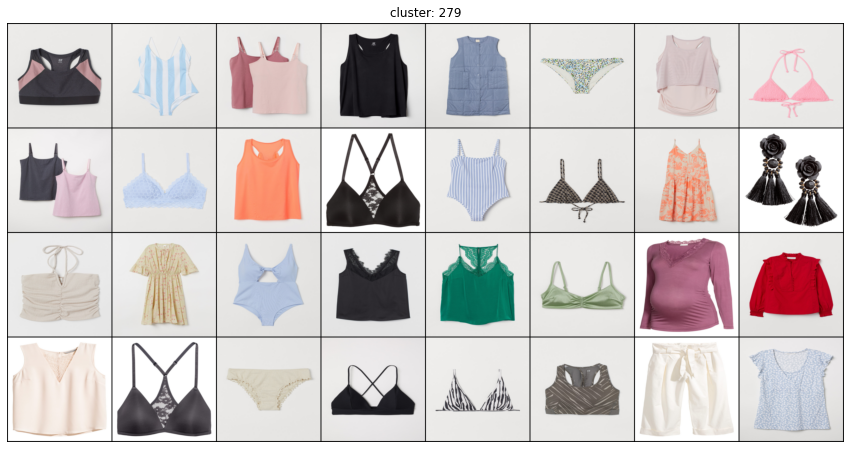

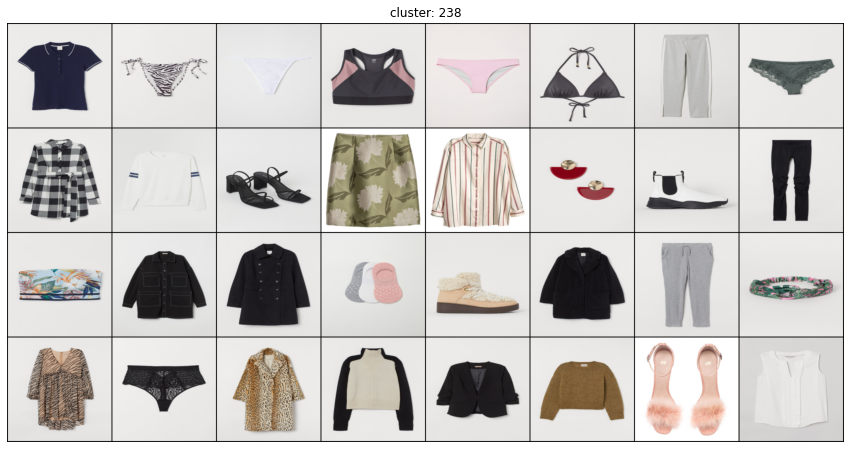

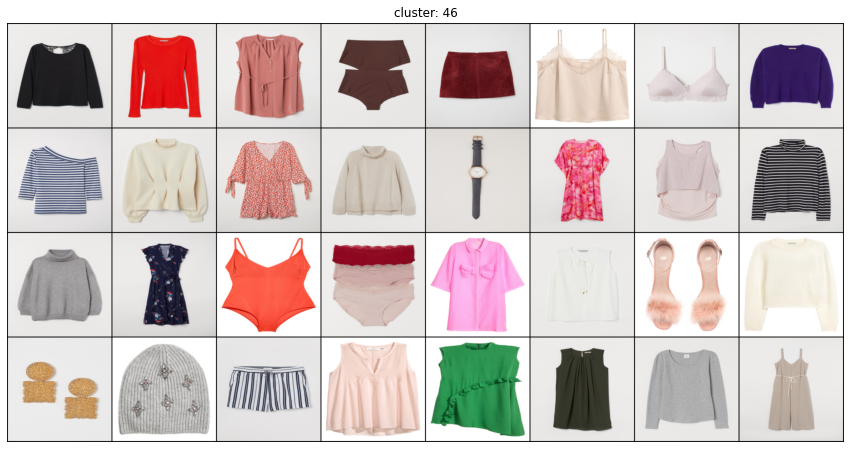

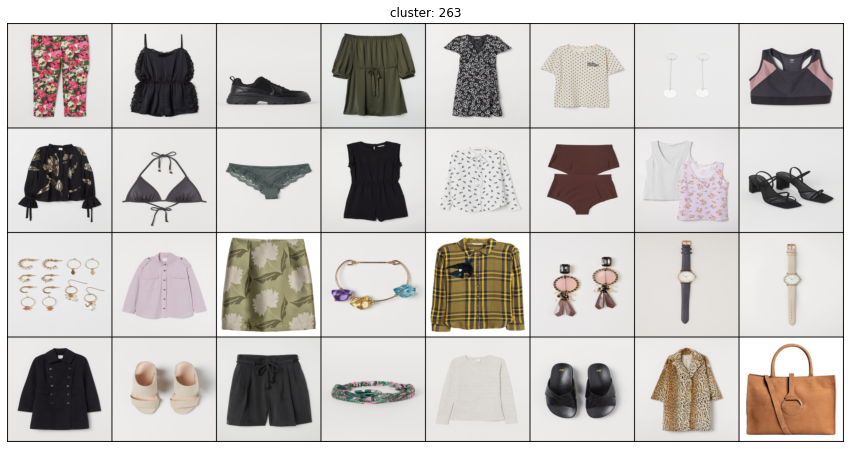

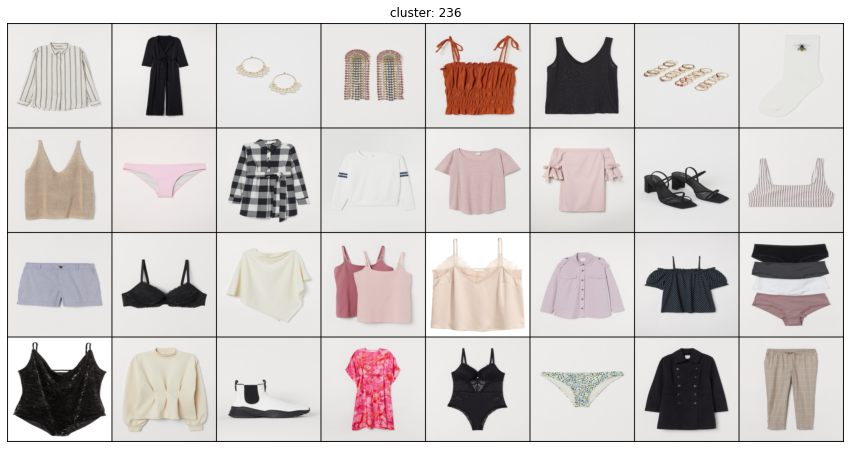

...

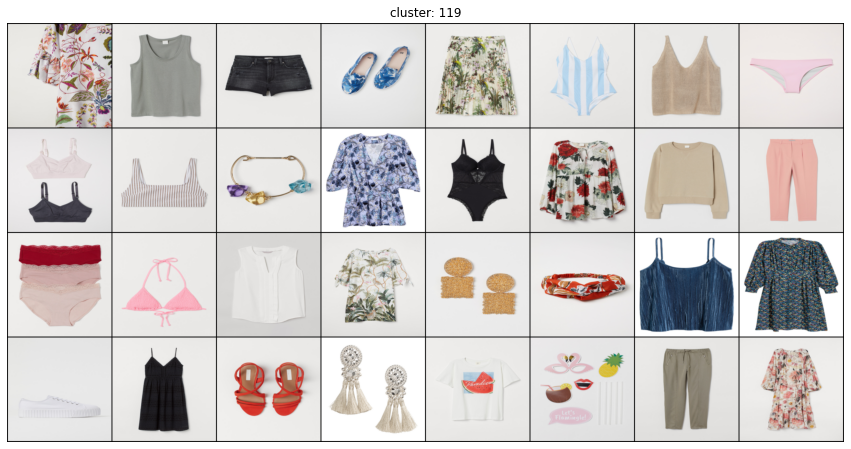

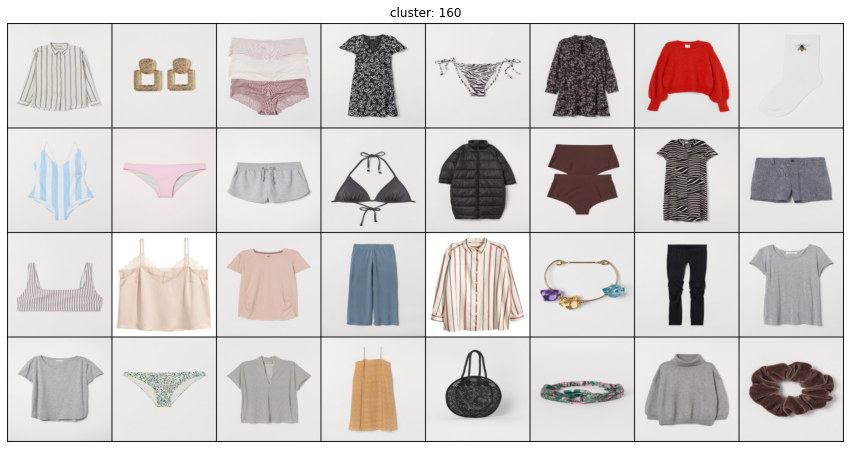

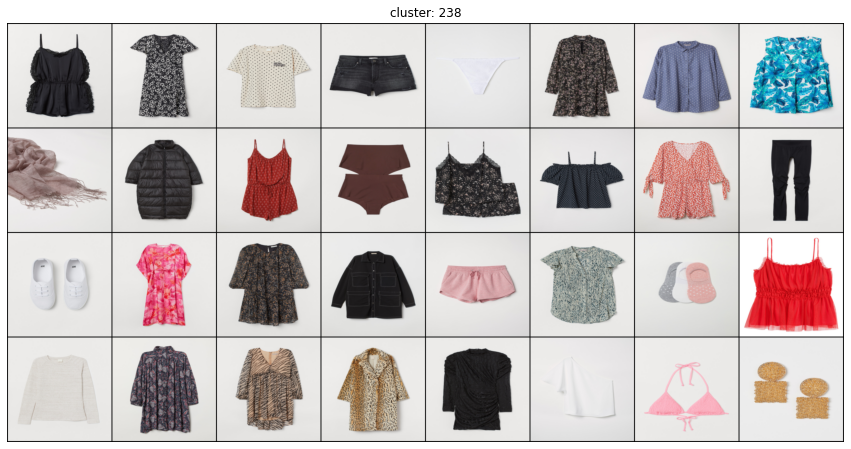

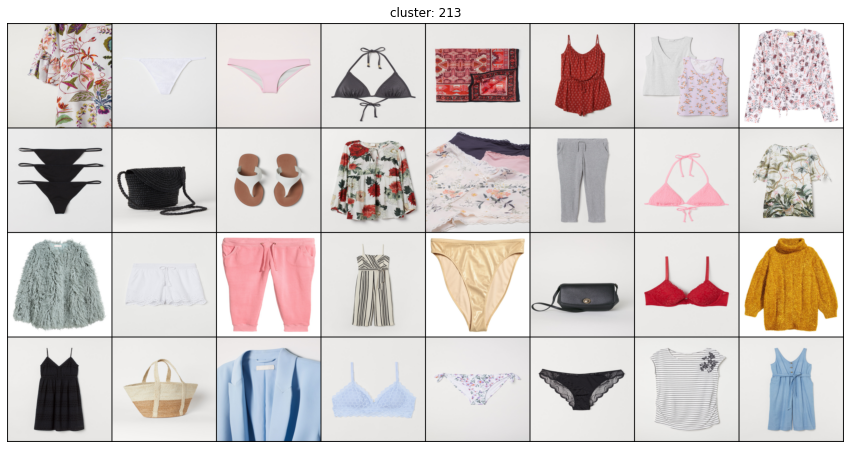

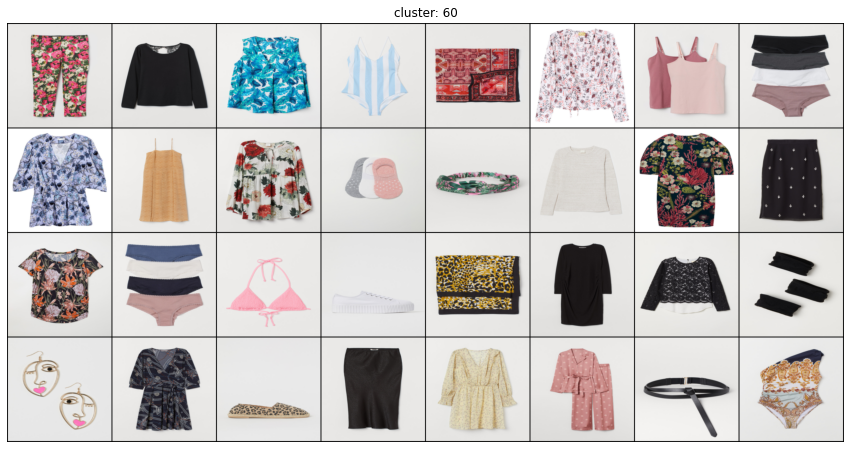

In [ ]:
train_losses = []
val_losses = []
pre_val_loss = 999
patience = 3
model_path =  'best_cluster_model.pth' 
train_pseudo_labels = []
val_pseudo_labels = []
train_nmi = [0]
val_nmi = [0]
cluster_train_nmi = [0]
cluster_val_nmi = [0]


for i in range(num_epochs):

    if i != 0: 
        del(model.top_layer)
    

    print(f'Epoch {i+1}')
    #train_cluster
    train_pseudo_labels.append(cluster(pca, kmeans, model, train_ds, batch_size)) # generate labels

    train_labeled_dataset = fashion_Datasets(img_path_list = train_img_path, labels = train_pseudo_labels[i], transform=transform) # make new dataset with labels matched to images
    label_dict = make_label_dict(train_pseudo_labels[i])
    sampler = UnifLabelSampler(int(1 * len(train_ds)), label_dict)

    counts = Counter(train_pseudo_labels[i])
    print(show_cluster(counts.most_common()[0][0], train_pseudo_labels[i], train_ds))


    #validation_cluster
    val_pseudo_labels.append(cluster(pca, kmeans, model, val_ds, batch_size))
    val_labeled_dataset = fashion_Datasets(img_path_list = val_img_path, labels = val_pseudo_labels[i], transform=transform) 
    
    #update
    train_losses.append(train(model,  train_labeled_dataset, batch_size, sampler)) # train for one epoch
    # train_nmi 측정 (cluster(t-1),cluster(t)) 
    if i != 0:
        train_nmi.append(normalized_mutual_info_score(train_pseudo_labels[i],train_pseudo_labels[i-1]))
        cluster_train_nmi.append(normalized_mutual_info_score(train_pseudo_labels[i],train_pseudo_labels[0]))
        print(f'Train_NMI:{train_nmi[i]}')
        print(f'Cluster_Train_NMI:{cluster_train_nmi[i]}')

    val_loss = val(model, val_labeled_dataset, batch_size)
    val_losses.append(val_loss)
    #val_nmi 측정   
    if i != 0:
        val_nmi.append(normalized_mutual_info_score(val_pseudo_labels[i],val_pseudo_labels[i-1]))
        cluster_val_nmi.append(normalized_mutual_info_score(val_pseudo_labels[i],val_pseudo_labels[0]))
        print(f'Val_NMI:{val_nmi[i]}')
        print(f'Cluster_Val_NMI:{cluster_val_nmi[i]}')

    if val_loss <= pre_val_loss:
        torch.save(model, model_path)
        best_val_loss = val_loss
        patience = 3
    else:
        patience -= 1
        if patience == 0:
            print(f'Early Stopping. Best_val_loss : {best_val_loss}')
            break
    pre_val_loss = val_loss




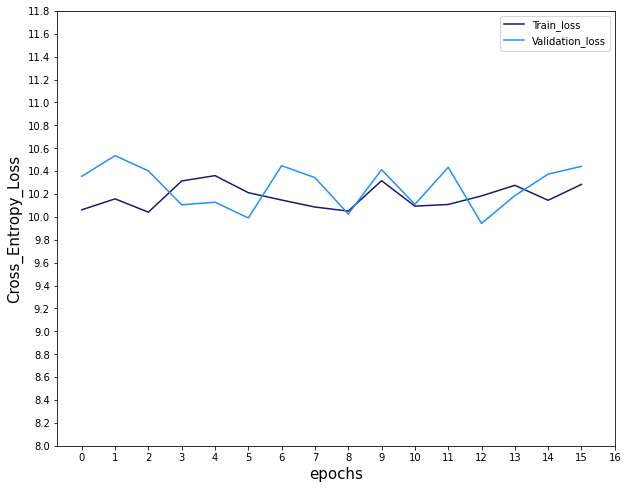

In [ ]:
# loss plot (train/vali)
def plot_loss(train_losses,val_losses):
    plt.plot(train_losses, 'midnightblue')
    plt.plot(val_losses, color='dodgerblue')
    plt.xticks(np.arange(0, 17, 1)) # 범위 수정 
    plt.yticks(np.arange(8, 12, 0.2)) # 범위 수정 
    plt.xlabel('epochs')
    plt.ylabel('Cross_Entropy_Loss')
    plt.legend(['Train_loss', 'Validation_loss']);

plt.figure(figsize = (10,8))
plt.rc('font', size=15)
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  
plot_loss(train_losses,val_losses)      
plt.savefig('loss_graph.png')

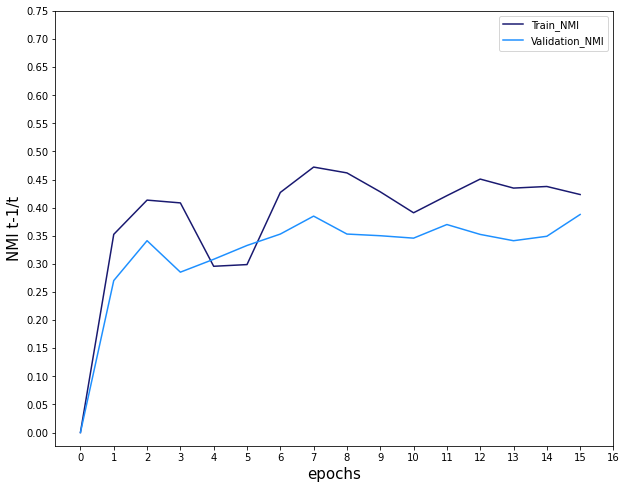

In [ ]:
plt.figure(figsize = (10,8))
plt.plot(train_nmi, 'midnightblue')
plt.plot(val_nmi, color='dodgerblue')
plt.xticks(np.arange(0, 17, 1)) # 범위 수정 
plt.yticks(np.arange(0, 0.8, 0.05)) # 범위 수정 
plt.xlabel('epochs')
plt.ylabel('NMI t-1/t')
plt.legend(['Train_NMI', 'Validation_NMI'])
plt.rc('font', size=15)
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  
     
plt.savefig('nmi_graph.png')

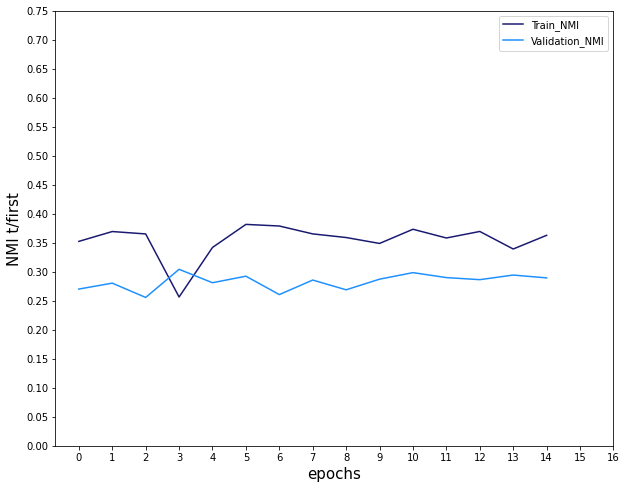

In [ ]:
plt.figure(figsize = (10,8))
plt.plot(cluster_train_nmi, 'midnightblue')
plt.plot(cluster_val_nmi, color='dodgerblue')
plt.xticks(np.arange(0, 17, 1)) # 범위 수정 
plt.yticks(np.arange(0, 0.8, 0.05)) # 범위 수정 
plt.xlabel('epochs')
plt.ylabel('NMI t/first')
plt.legend(['Train_NMI', 'Validation_NMI'])
plt.rc('font', size=15)
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  
     
plt.savefig('cluster_nmi_graph.png')

In [ ]:
# Whole dataset 
full_ds = fashion_Datasets(img_path_list = img_path_list, transform=transform)

In [ ]:
pseudo_labels, features = cluster(pca, kmeans, model, full_ds, batch_size, return_features=True) 

extracting features: 100%|██████████| 618/618 [29:19<00:00,  2.85s/it]


[[-2.4058912e+00 -1.1785556e+00  4.8229280e+00 ... -9.3972063e-01
  -2.1319535e+00  1.5507990e+00]
 [-1.4317310e+00 -1.8400614e+00  1.1085074e+00 ... -3.4147251e-01
   7.8736711e-01  6.1834127e-01]
 [-1.0943764e+00 -2.6857190e+00  1.9322587e+00 ... -2.2100271e-01
   1.9606225e-02 -1.9033708e-01]
 ...
 [-2.9746323e+00 -2.4347301e+00 -1.8359426e+00 ... -1.8415824e+00
  -3.0021336e+00  1.8332102e+00]
 [ 2.5929773e-01 -2.8330050e+00 -2.8141520e+00 ... -1.2157584e+00
  -9.3430243e-02  5.1653400e-02]
 [ 2.0633955e+00 -6.1715454e-01 -2.7823059e-03 ...  1.2585107e+00
   4.9348965e+00 -1.2282988e+00]]


In [ ]:
import pickle

In [ ]:
# load data
with open('pseudo_labels.pickle', 'rb') as fr:
    pseudo_labels = pickle.load(fr)

In [ ]:
label_dict = make_label_dict(pseudo_labels)

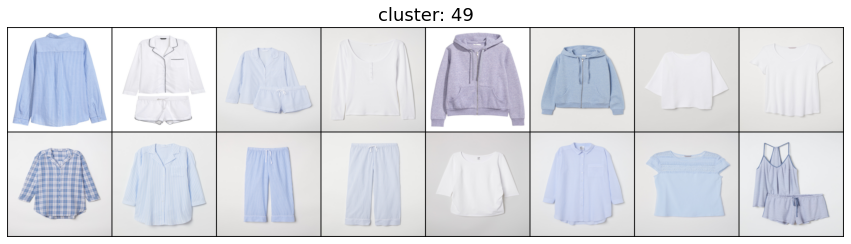

In [ ]:
show_cluster(counts.most_common()[5][0], pseudo_labels, full_ds)
plt.savefig('cluster5.png')

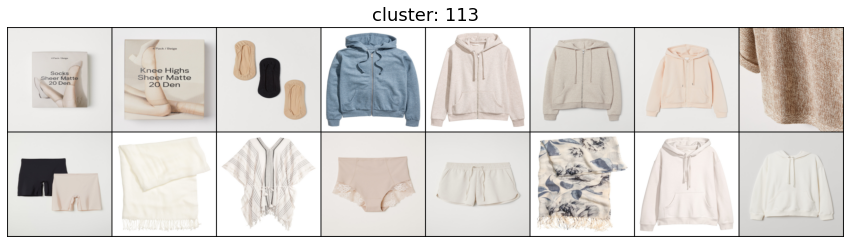

In [ ]:
show_cluster(counts.most_common()[6][0], pseudo_labels, full_ds)
plt.savefig('cluster6.png')

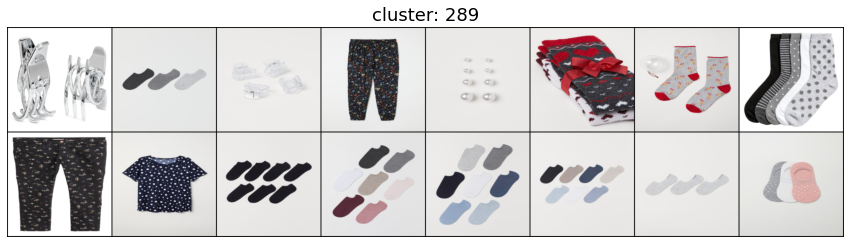

In [ ]:
show_cluster(counts.most_common()[7][0], pseudo_labels, full_ds)
plt.savefig('cluster7.png')

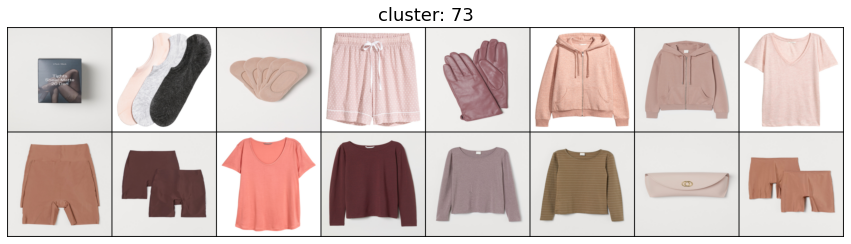

In [ ]:
show_cluster(counts.most_common()[8][0], pseudo_labels, full_ds)
plt.savefig('cluster8.png')

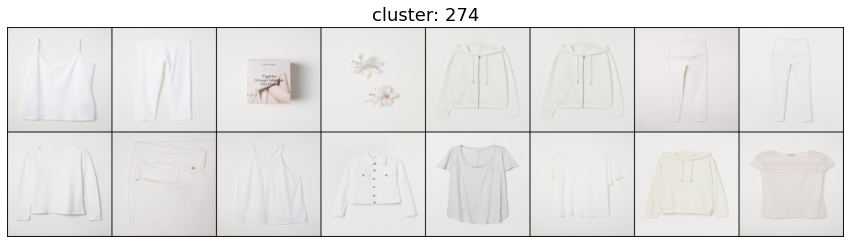

In [ ]:
show_cluster(counts.most_common()[9][0], pseudo_labels, full_ds)
plt.savefig('cluster9.png')

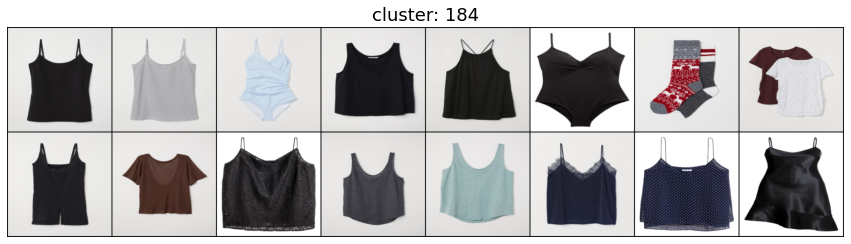

In [ ]:
show_cluster(counts.most_common()[10][0], pseudo_labels, full_ds)
plt.savefig('cluster10.png')

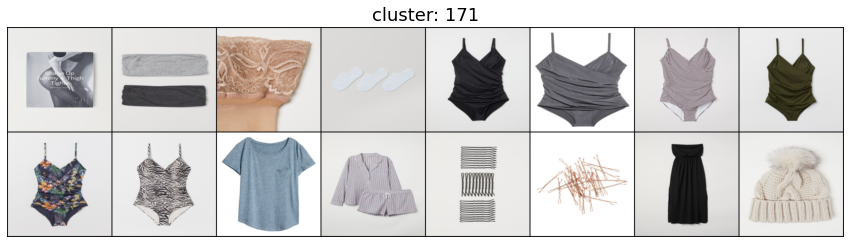

In [ ]:
show_cluster(counts.most_common()[0][0], pseudo_labels, full_ds)
plt.savefig('cluster0.png')

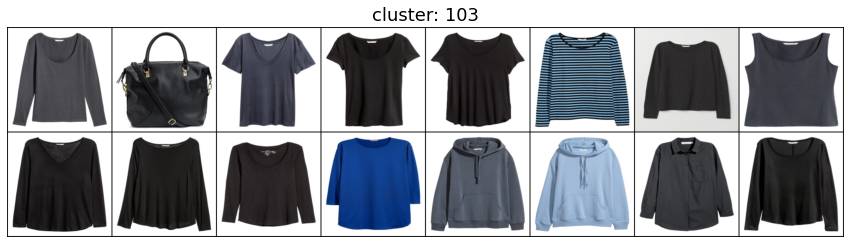

In [ ]:
show_cluster(counts.most_common()[27][0], pseudo_labels, full_ds)
plt.savefig('cluster27.png')

# Ranking via KNN 

In [ ]:
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(metric='cosine')
knn.fit(features)

NearestNeighbors(metric='cosine')

In [ ]:
neighbors = []
for i in tqdm(range(len(img_path_list))):
  neighbors.append(list(np.delete(np.fliplr(knn.kneighbors([features[i]], n_neighbors=13, return_distance=False)),-1)))

100%|██████████| 39552/39552 [2:03:14<00:00,  5.35it/s]


In [ ]:
Ladies['rec_cnn'] = neighbors

In [ ]:
Ladies['article_idx'] = Ladies.index

In [ ]:
Ladies.to_csv('/content/drive/MyDrive/고통/Ladies.csv')

In [ ]:
df = pd.read_csv('df.csv')

In [ ]:
Ladies = Ladies.drop(['product_code', 'prod_name', 'product_type_no',
       'product_type_name', 'product_group_name', 'graphical_appearance_no',
       'graphical_appearance_name', 'colour_group_code', 'colour_group_name',
       'perceived_colour_value_id', 'perceived_colour_value_name',
       'perceived_colour_master_id', 'perceived_colour_master_name',
       'department_no', 'department_name', 'index_code', 'index_name',
       'index_group_no', 'index_group_name', 'section_no', 'section_name',
       'garment_group_no', 'garment_group_name', 'detail_desc'],axis=1)

In [ ]:
test_trs = pd.read_csv('test_trs.csv')

In [ ]:
test_trs = pd.merge(test_trs,Ladies,how='left',on='article_id')

In [ ]:
test_dict2 = {}
for custom in tqdm(range(53248)):
  test_dict2[custom] = list(test_trs[test_trs.customer_id_num == custom].article_idx)

100%|██████████| 53248/53248 [03:15<00:00, 272.45it/s]


In [ ]:
test_trs_dict2 = {}
for i in tqdm(range(2386216)):
    test_trs_dict2[i] = test_dict2[test_trs.customer_id_num[i]] 

100%|██████████| 2386216/2386216 [00:43<00:00, 54446.10it/s]


In [ ]:
Ladies['rec_cnn']

0        [16836, 5650, 17458, 26482, 10489, 14224, 2384...
1        [11803, 2, 15778, 35471, 12278, 24975, 25973, ...
2        [25058, 31292, 31103, 1, 28477, 14228, 5627, 3...
3        [33425, 7007, 29608, 1751, 15569, 34, 23626, 1...
4        [28334, 33424, 17772, 10137, 15566, 21685, 322...
                               ...                        
39547    [25085, 14091, 23430, 29728, 15186, 18057, 145...
39548    [18638, 18443, 31019, 39235, 7540, 18057, 2178...
39549    [133, 35847, 10434, 25266, 36726, 11116, 22039...
39550    [15029, 27226, 24846, 23532, 31156, 30559, 275...
39551    [12319, 20782, 33152, 38906, 11330, 4802, 9928...
Name: rec_cnn, Length: 39552, dtype: object

In [ ]:
cnn_dict = {}
for i in tqdm(range(39552)):
  cnn_dict[i] = Ladies.rec_cnn[i]

100%|██████████| 39552/39552 [00:00<00:00, 95403.59it/s]


In [ ]:
cnn_dict[100] # 100번째 item의 top12 상품들

[39369,
 26672,
 25071,
 6636,
 23338,
 38604,
 23341,
 4881,
 31608,
 38508,
 14781,
 36940]

# Get MAP@

In [ ]:
cnn_trs_dict = {}
for i in tqdm(range(2386216)):
    cnn_trs_dict[i] = cnn_dict[test_trs.article_idx[i]] 

100%|██████████| 2386216/2386216 [00:44<00:00, 53860.49it/s]


In [ ]:
cnn_result = {}
for i in tqdm(range(2386216)):
  temp = []
  for j in range(12):
    if cnn_trs_dict[i][j] in test_trs_dict2[i]:
      temp.append(1)
    else:
      temp.append(0)

  cnn_result[i] = temp

100%|██████████| 2386216/2386216 [08:12<00:00, 4848.76it/s]


In [ ]:
def get_map12(result):
  ans = 0
  for i in tqdm(range(2386216)):
    temp = 0
    bought = 0
    for j in range(12):
      if result[i][j] == 1:
        bought += 1
        temp += bought/(j+1)
    ans += temp/12
  return ans/2386216

In [ ]:
get_map12(cnn_result)

100%|██████████| 2386216/2386216 [00:04<00:00, 568279.73it/s]


0.0035077247272813487

In [ ]:
# most popular
from collections import Counter
popular = Counter(df.article_id).most_common()

In [ ]:
pop = [p[0] for p in popular[:12]]

In [ ]:
pop_idx = list(Ladies[Ladies.article_id.isin(pop)].article_idx)

In [ ]:
pop_idx

[520, 614, 615, 725, 1084, 4828, 4841, 5300, 8541, 15055, 15084, 16416]

In [ ]:
def show_top12(pop_idx, full_ds):
    images = []
   
    for i in range(12):
        image, _ = full_ds[pop_idx[i]]
        images.append(image)
        
    gridded = make_grid(images, nrow=3)
    plt.figure(figsize=(15, 10))
    plt.imshow(gridded.permute(1, 2, 0))
    plt.axis('off')

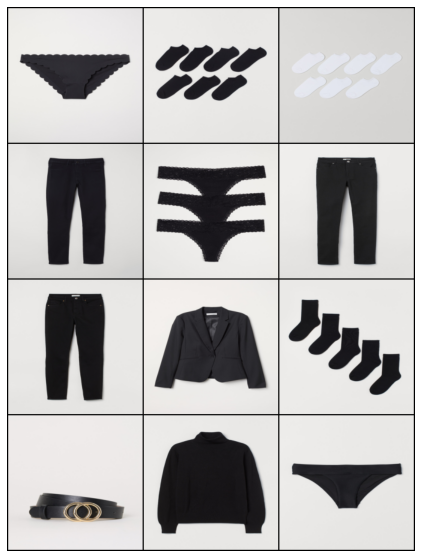

In [ ]:
show_top12(pop_idx,full_ds)
plt.savefig('pop12.png')

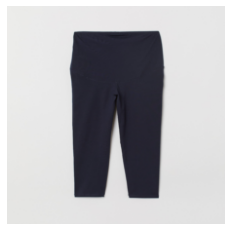

In [ ]:
temp_image = image_dataset[100][0].numpy()
temp_image = np.transpose(temp_image, (1,2,0))
plt.imshow(temp_image)
plt.axis('off')
plt.savefig('100_0.png')

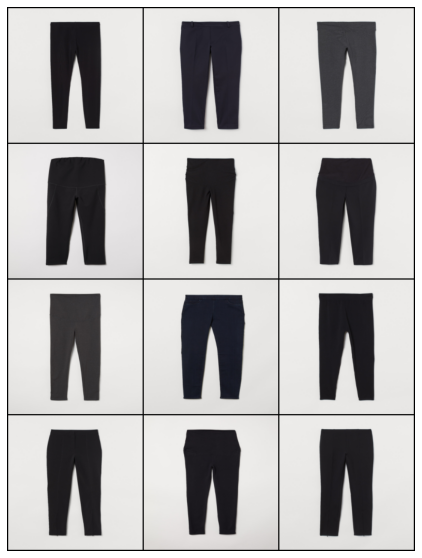

In [ ]:
show_top12(cnn_dict[100],full_ds)
plt.savefig('100.png')

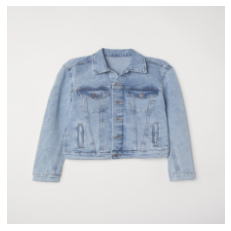

In [ ]:
temp_image = image_dataset[711][0].numpy()
temp_image = np.transpose(temp_image, (1,2,0))
plt.imshow(temp_image)
plt.axis('off')
plt.savefig('711_0.png')

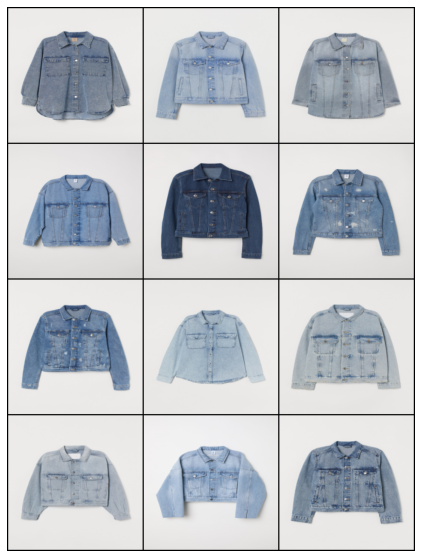

In [ ]:
show_top12(cnn_dict[711],full_ds)
plt.savefig('711.png')

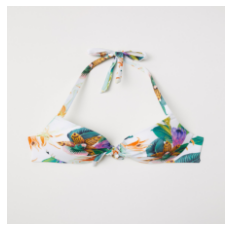

In [ ]:
temp_image = image_dataset[66][0].numpy()
temp_image = np.transpose(temp_image, (1,2,0))
plt.imshow(temp_image)
plt.axis('off')
plt.savefig('66_0.png')

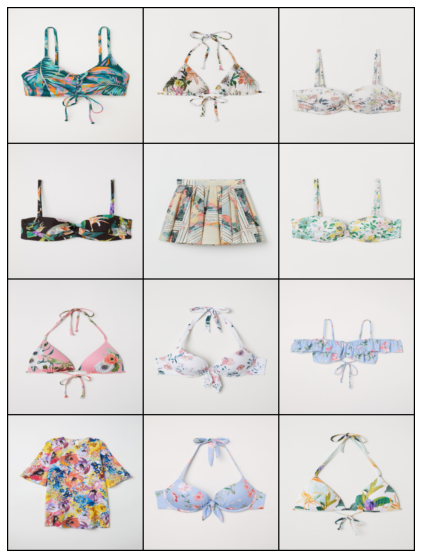

In [ ]:
show_top12(cnn_dict[66],full_ds)
plt.savefig('66.png')

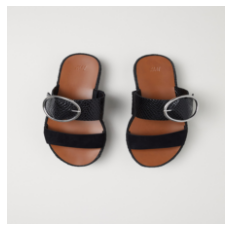

In [ ]:
temp_image = image_dataset[9999][0].numpy()
temp_image = np.transpose(temp_image, (1,2,0))
plt.imshow(temp_image)
plt.axis('off')
plt.savefig('9999.png')

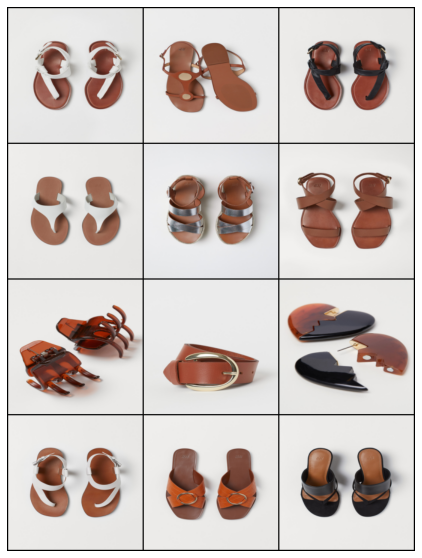

In [ ]:
show_top12(cnn_dict[9999],full_ds)
plt.savefig('9999_1.png')